In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import random

## Load Data

In [69]:
# Load the labeled data
good_examples = pd.read_csv('./InDaS Labeled/good_period_2024_01_03.csv')
good_examples

bad_examples = pd.read_csv('./InDaS Labeled/bad_period_2024_01_06.csv')
bad_examples

all_good_segments = []
all_bad_segments = []

## Preprocess Data

In [70]:
# Apply the indicator function to create a new column
good_examples['indicator'] = good_examples.apply(lambda x: 1 if x['rel_time'] == 0 else 0, axis=1)

start_indices_good = good_examples.index[good_examples['indicator'] == 1].tolist()

# Add the end of the DataFrame as the last index
start_indices_good.append(len(good_examples))


# Loop through each segment and plot, limiting the number of rotations
for i in range(len(start_indices_good)-1):
    good_segment = good_examples.iloc[start_indices_good[i]:start_indices_good[i + 1]]
    all_good_segments.append(good_segment)

print("Total Good Cutting Data:", len(all_good_segments))
print("Shape of Segment 1:", all_good_segments[0].shape)
print("Shape of Torque Data:", all_good_segments[0]['Torque'].shape)


Total Good Cutting Data: 4552
Shape of Segment 1: (1668, 11)
Shape of Torque Data: (1668,)


In [71]:
# Apply the indicator function to create a new column
bad_examples['indicator'] = bad_examples.apply(lambda x: 1 if x['rel_time'] == 0 else 0, axis=1)

start_indices_bad = bad_examples.index[bad_examples['indicator'] == 1].tolist()

# Add the end of the DataFrame as the last index
start_indices_bad.append(len(bad_examples))

# Loop through each segment and plot, limiting the number of rotations
for i in range(len(start_indices_bad)-1):
    segment = bad_examples.iloc[start_indices_bad[i]:start_indices_bad[i + 1]]
    all_bad_segments.append(segment)

print("Total Bad Cutting Data:", len(all_bad_segments))
print("Shape of Segment 1:", all_bad_segments[0].shape)
print("Shape of Torque Data:", all_bad_segments[0]['Torque'].shape)


Total Bad Cutting Data: 1937
Shape of Segment 1: (1668, 11)
Shape of Torque Data: (1668,)


## Plot Original Time Series

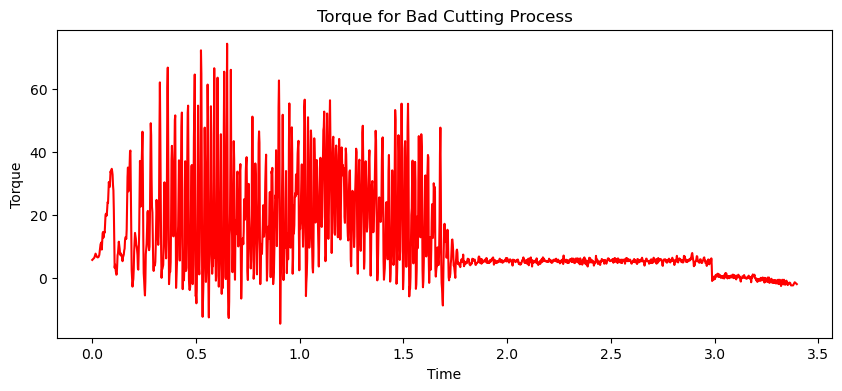

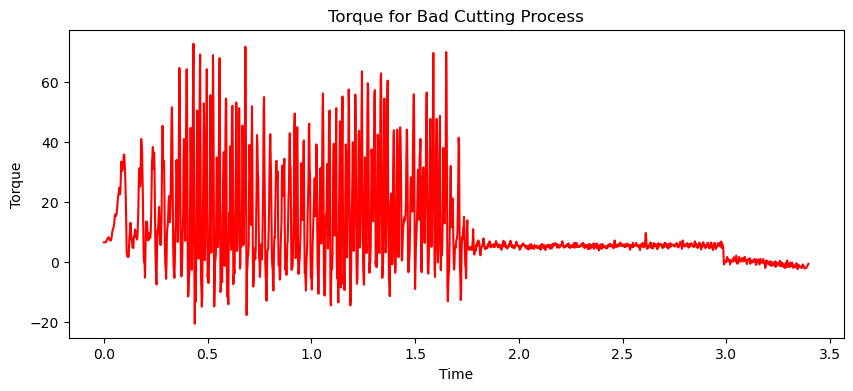

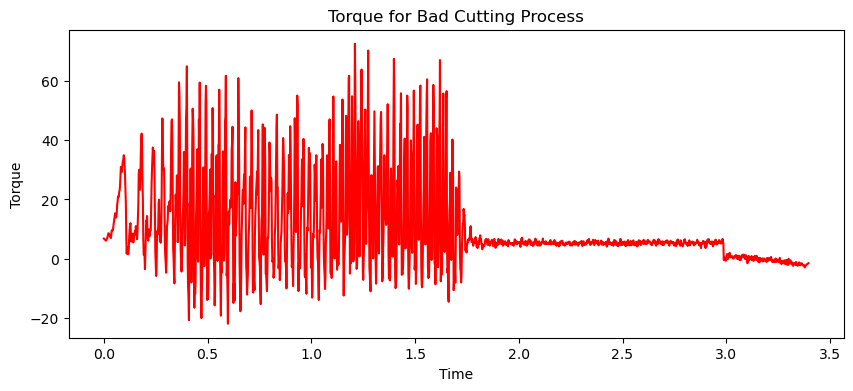

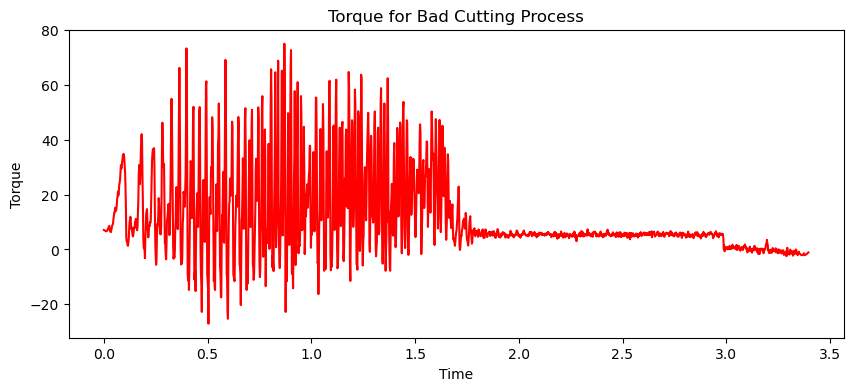

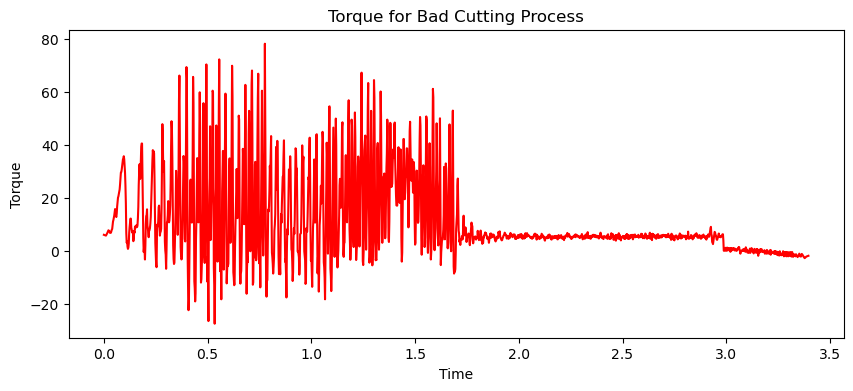

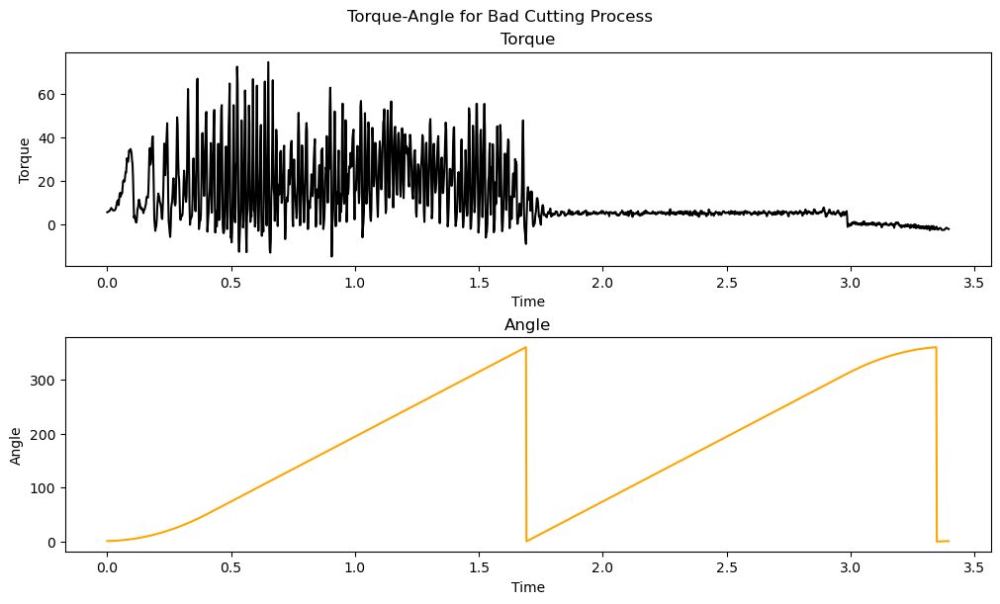

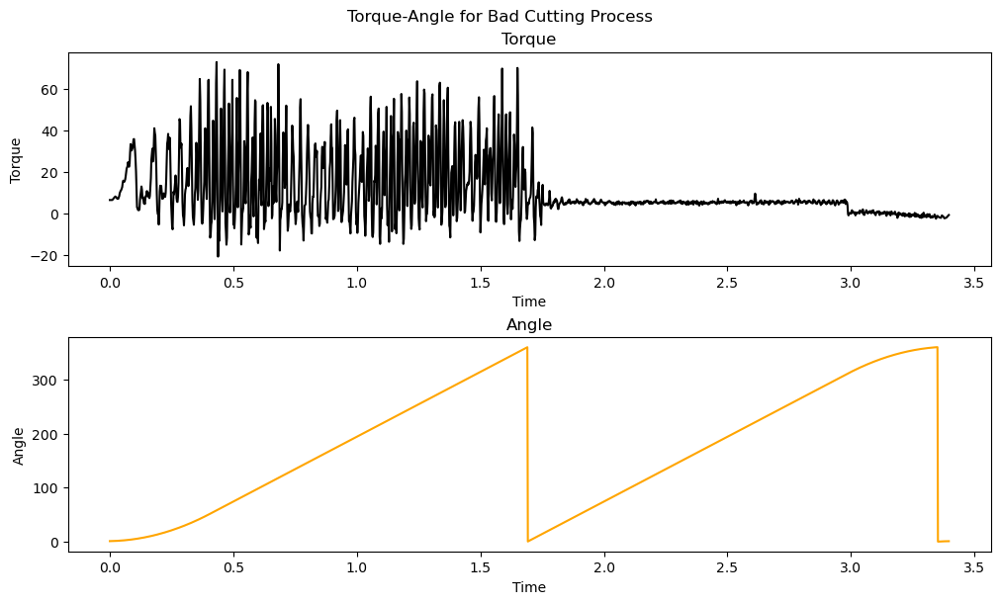

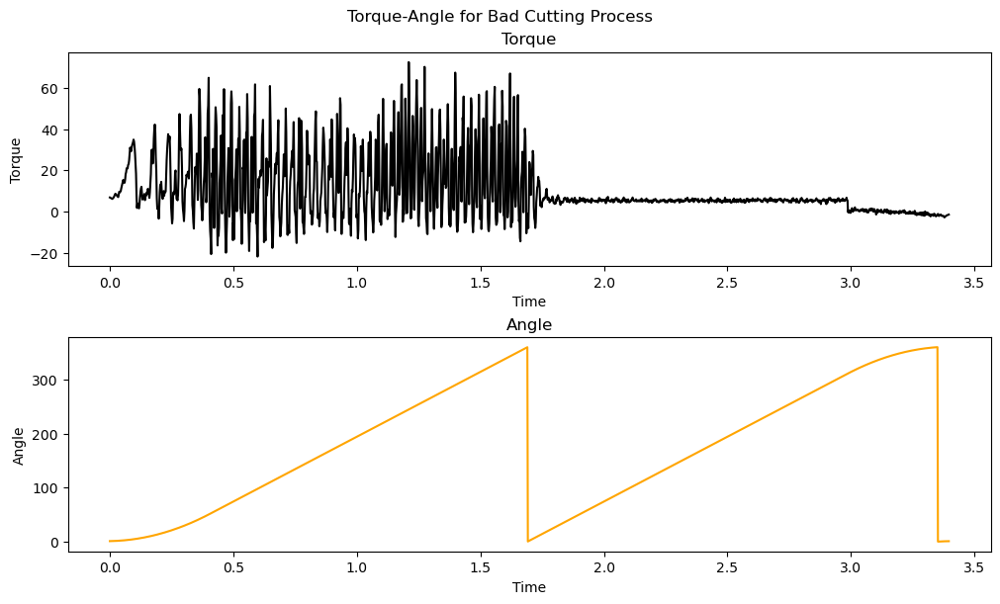

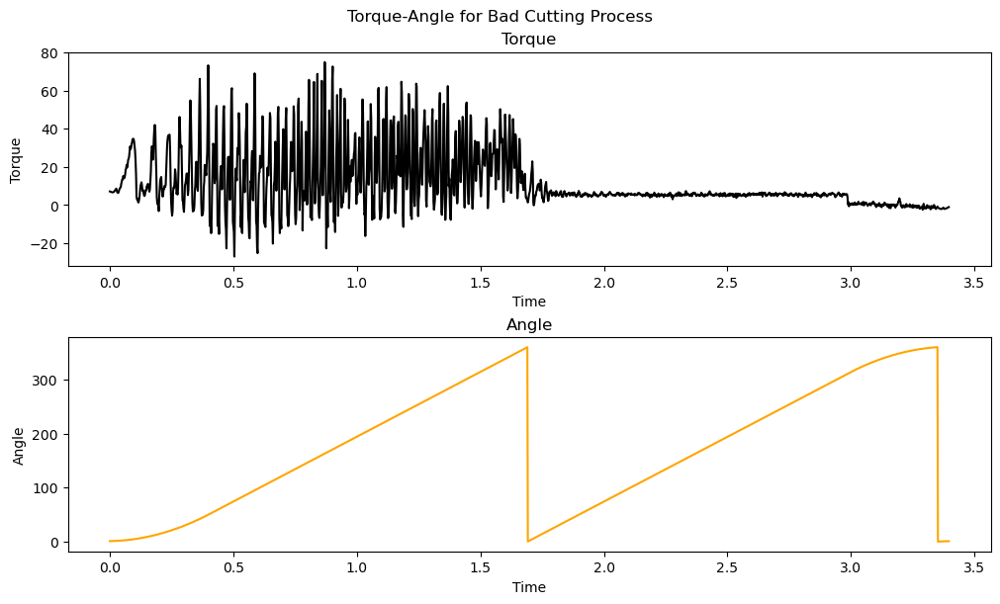

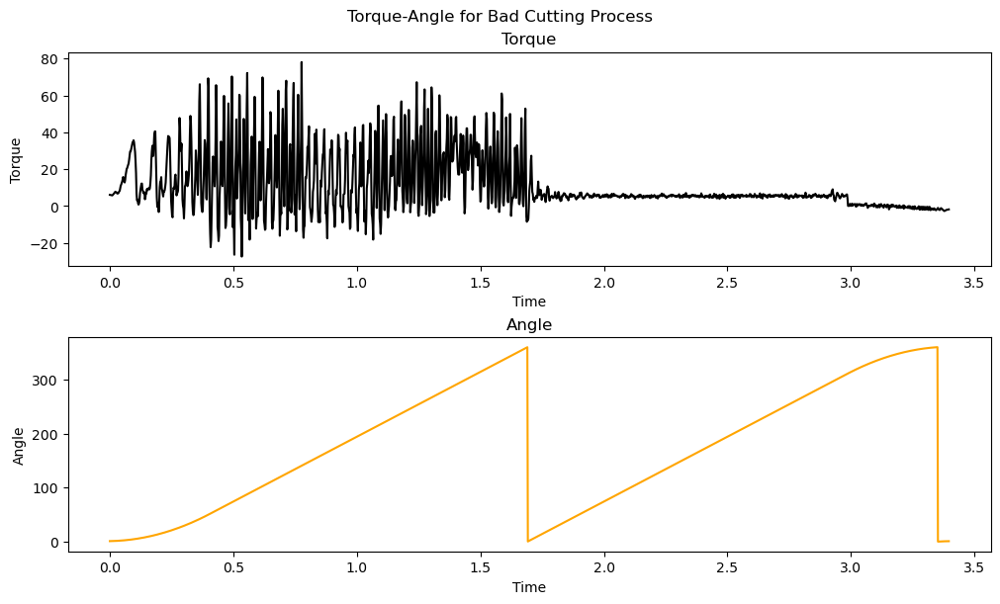

In [72]:
#334D10
Samples = 5
#print(all_good_segments[0].head())
#print((all_good_segments[0]['Torque']).shape)
# The frequency at which the torque data was sampled


for i in range(Samples):
    fig = plt.figure(figsize=(10, 4))
    plt.plot(all_bad_segments[i]['rel_time'], all_bad_segments[i]['Torque'], color='red')
    plt.title("Torque for Bad Cutting Process")
    plt.xlabel('Time')
    plt.ylabel('Torque')
    plt.show()
    #fig.savefig(f'/home/admin-anedunga/Desktop/InDas_Template/figures and graphs/time_bad_torque{random.randint(1, 9)}.png', dpi=fig.dpi)

# Subplot cutting and angle
for i in range(Samples):
    fig, axs = plt.subplots(2, 1, layout='constrained', figsize=(10, 6))
    fig.suptitle("Torque-Angle for Bad Cutting Process")
    axs[0].plot(all_bad_segments[i]['rel_time'], all_bad_segments[i]['Torque'], color='black')
    axs[0].set_title('Torque')
    axs[0].set(xlabel='Time', ylabel='Torque')
    axs[1].plot(all_bad_segments[i]['rel_time'], all_bad_segments[i]['Angle'], color = 'orange')
    axs[1].set_title('Angle')
    axs[1].set(xlabel='Time', ylabel='Angle')
    plt.show()
    #fig.savefig(f'/home/admin-anedunga/Desktop/InDas_Template/figures and graphs/time_bad_torque_angle{random.randint(1, 9)}.png', dpi=fig.dpi)


In [73]:
# segment the cutting process into 4 phases - onramp, cutting, cleaning, offramp
# time for 4 phases - 0.0-0.50; 0.50-1.60; 1.60-3.0; 3.0-3.5

PLOT = False
# Bad Samples
good_onramps = list()
good_cuttings = list()
good_cleanings = list()
good_offramps = list()
# Good Samples
for i in range(Samples):
    good_onramp_segment = all_good_segments[i].loc[(all_good_segments[i]['rel_time'] >= 0.0) & (all_good_segments[i]['rel_time'] <= 0.50)]
    good_cutting_segment = all_good_segments[i].loc[(all_good_segments[i]['rel_time'] > 0.50) & (all_good_segments[i]['rel_time'] <= 1.60)]
    good_cleaning_segment = all_good_segments[i].loc[(all_good_segments[i]['rel_time'] > 1.60) & (all_good_segments[i]['rel_time'] <= 3.0)]
    good_offramp_segment = all_good_segments[i].loc[(all_good_segments[i]['rel_time'] > 3.0) & (all_good_segments[i]['rel_time'] <= 3.5)]

    good_onramps.append(good_onramp_segment)
    good_cuttings.append(good_cutting_segment)
    good_cleanings.append(good_cleaning_segment)
    good_offramps.append(good_offramp_segment)    

    if PLOT:
        fig, axs = plt.subplots(2, 2, layout='constrained', figsize=(10, 6))
        fig.suptitle("Torque for Good Cutting Process")
        axs[0, 0].plot(good_onramp_segment['rel_time'], good_onramp_segment['Torque'], color='black')
        axs[0, 0].set_title('Onramp')
        axs[0, 0].set(xlabel='Time', ylabel='Torque')
        axs[0, 1].plot(good_cutting_segment['rel_time'], good_cutting_segment['Torque'], color='black')
        axs[0, 1].set_title('Cutting')
        axs[0, 1].set(xlabel='Time', ylabel='Torque')
        axs[1, 0].plot(good_cleaning_segment['rel_time'], good_cleaning_segment['Torque'], color='black')
        axs[1, 0].set_title('Cleaning')
        axs[1, 0].set(xlabel='Time', ylabel='Torque')
        axs[1, 1].plot(good_offramp_segment['rel_time'], good_offramp_segment['Torque'], color='black')
        axs[1, 1].set_title('Offramp')
        axs[1, 1].set(xlabel='Time', ylabel='Torque')
        plt.show()


In [74]:


PLOT = False
# Bad Samples
bad_onramps = list()
bad_cuttings = list()
bad_cleanings = list()
bad_offramps = list()
for i in range(Samples):
    bad_onramp_segment = all_bad_segments[i].loc[(all_bad_segments[i]['rel_time'] >= 0.0) & (all_bad_segments[i]['rel_time'] <= 0.50)]
    bad_cutting_segment = all_bad_segments[i].loc[(all_bad_segments[i]['rel_time'] > 0.50) & (all_bad_segments[i]['rel_time'] <= 1.60)]
    bad_cleaning_segment = all_bad_segments[i].loc[(all_bad_segments[i]['rel_time'] > 1.60) & (all_bad_segments[i]['rel_time'] <= 3.0)]
    bad_offramp_segment = all_bad_segments[i].loc[(all_bad_segments[i]['rel_time'] > 3.0) & (all_bad_segments[i]['rel_time'] <= 3.5)]

    # Append the segments to the lists
    bad_onramps.append(bad_onramp_segment)
    bad_cuttings.append(bad_cutting_segment)
    bad_cleanings.append(bad_cleaning_segment)
    bad_offramps.append(bad_offramp_segment)

    # Plot
    if PLOT:
        fig, axs = plt.subplots(2, 2, layout='constrained', figsize=(10, 6))
        fig.suptitle("Torque for Bad Cutting Process")
        axs[0, 0].plot(bad_onramp_segment['rel_time'], bad_onramp_segment['Torque'], color='red')
        axs[0, 0].set_title('Onramp')
        axs[0, 0].set(xlabel='Time', ylabel='Torque')
        axs[0, 1].plot(bad_cutting_segment['rel_time'], bad_cutting_segment['Torque'], color='red')
        axs[0, 1].set_title('Cutting')
        axs[0, 1].set(xlabel='Time', ylabel='Torque')
        axs[1, 0].plot(bad_cleaning_segment['rel_time'], bad_cleaning_segment['Torque'], color='red')
        axs[1, 0].set_title('Cleaning')
        axs[1, 0].set(xlabel='Time', ylabel='Torque')
        axs[1, 1].plot(bad_offramp_segment['rel_time'], bad_offramp_segment['Torque'], color='red')
        axs[1, 1].set_title('Offramp')
        axs[1, 1].set(xlabel='Time', ylabel='Torque')
        plt.show()

## Plotting Scalograms

In [75]:
# import pywt

# Samples = 3

# def plot_wavelet_scalogram(data, title, wavelet='cmor', cmap='magma'):
#     scales = np.arange(1, 128)
#     coefficients, frequencies = pywt.cwt(data, scales, wavelet)
#     power = (abs(coefficients)) ** 2
#     plt.imshow(power, extent=[0, data.size, 1, 128], cmap=cmap, aspect='auto', vmax=abs(coefficients).max(), vmin=abs(coefficients).min())
#     #plt.yscale('log')
#     plt.ylabel('Frequency (Hz)')
#     plt.xlabel('Time')
#     plt.colorbar(label='Magnitude')
#     plt.title(title)
#     plt.show()

# def plot_scalogram(data, title, wavelet='cmor'):
#     scales = np.arange(1, 128)  # Define the range of scales
#     coeffs, freqs = pywt.cwt(data, scales, wavelet)

#     plt.imshow(np.abs(coeffs), extent=[0, len(data), scales[-1], scales[0]], cmap='magma', aspect='auto',
#                vmax=np.abs(coeffs).max(), vmin=-np.abs(coeffs).max())
#     plt.colorbar(label='Magnitude')
#     plt.xlabel('Time (Coefficient Index)')
#     plt.ylabel('Frequency (Hz)')
#     plt.title(title)
#     plt.show()


# plot_scalogram(all_bad_segments[0]['Torque'], 'Bad Torque Scalogram')
# plot_scalogram(all_good_segments[0]['Torque'], 'Good Torque Scalogram')
# plot_wavelet_scalogram(all_bad_segments[0]['Torque'], 'Bad Energy Scalogram')
# plot_wavelet_scalogram(all_good_segments[0]['Torque'], 'Good Energy Scalogram')



## Plotting scalograms of different phases of cutting process

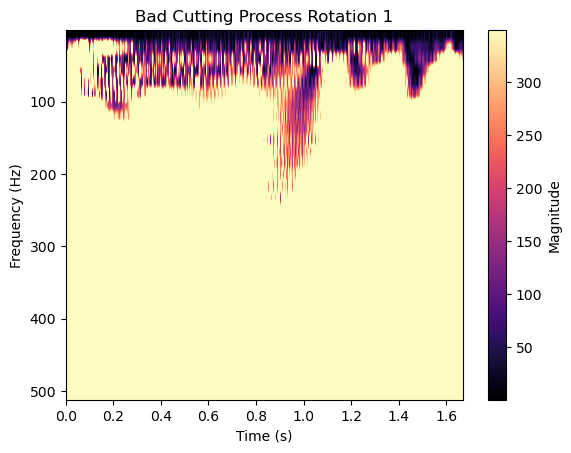

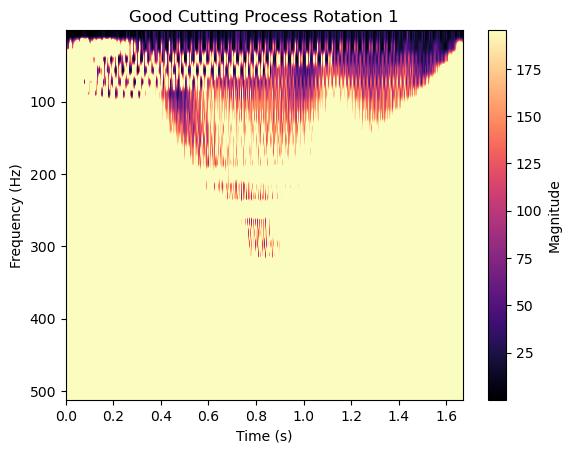

In [136]:
import pywt

scale_resolution = 512

def plot_wavelet_scalogram(data, title, wavelet='cmor', cmap='magma'):
    #scales = np.arange(1, scale_resolution)
    scales = np.linspace(1, scale_resolution, 32)
    coefficients, frequencies = pywt.cwt(data, scales, wavelet)
    power = (abs(coefficients)) ** 2
    
    time_vector = np.arange(len(data)) * 0.002

    plt.imshow(power, cmap=cmap, aspect='auto', vmax=abs(coefficients).max(), vmin=abs(coefficients).min(), extent=[time_vector[0], time_vector[-1], scales[-1], scales[0]])
    #plt.yscale('log')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')
    plt.colorbar(label='Magnitude')
    plt.title(title)
    plt.show()

def plot_scalogram(data, title, wavelet='cmor'):
    scales = np.arange(1, scale_resolution)  # Define the range of scales
    coeffs, freqs = pywt.cwt(data, scales, wavelet)

    plt.imshow(np.abs(coeffs), extent=[0, len(data), scales[-1], scales[0]], cmap='magma', aspect='auto',
               vmax=np.abs(coeffs).max(), vmin=-np.abs(coeffs).max())
    plt.colorbar(label='Magnitude')
    plt.xlabel('Time (Coefficient Index)')
    plt.ylabel('Frequency (Hz)')
    plt.title(title)
    plt.show()


# plot_wavelet_scalogram(bad_onramps[0]['Torque'], 'Bad Onramp')
# plot_wavelet_scalogram(bad_cuttings[0]['Torque'], 'Bad Cutting')
# plot_wavelet_scalogram(bad_cleanings[0]['Torque'], 'Bad Cleaning Energy')
# plot_wavelet_scalogram(bad_offramps[0]['Torque'], 'Bad Offramp Energy')

# plot_wavelet_scalogram(good_onramps[0]['Torque'], 'Good Onramps')
# plot_wavelet_scalogram(good_cuttings[0]['Torque'], 'Good Cutting')
# plot_wavelet_scalogram(good_cleanings[0]['Torque'], 'Good Cleaning Energy')
# plot_wavelet_scalogram(good_offramps[0]['Torque'], 'Good Offramp Energy')

random_sample = random.randint(0, len(all_bad_segments)-1)

plot_wavelet_scalogram(all_bad_segments[random_sample]['Torque'][0:836], 'Bad Cutting Process Rotation 1')
plot_wavelet_scalogram(all_good_segments[random_sample]['Torque'][0:836], 'Good Cutting Process Rotation 1')
#plot_wavelet_scalogram(all_bad_segments[random_sample]['Torque'][836:len(all_bad_segments[random_sample]['Torque'])], 'Bad Cutting Process Rotation 2')
#plot_wavelet_scalogram(all_good_segments[random_sample]['Torque'][836:len(all_good_segments[random_sample]['Torque'])], 'Good Cutting Process Rotation 2')


## Examine Scalograms only for Cutting

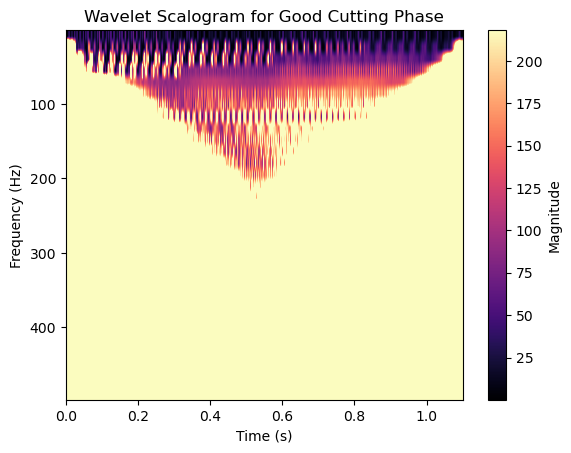

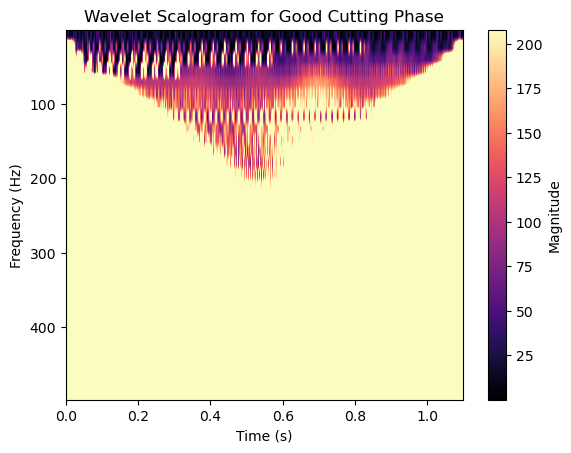

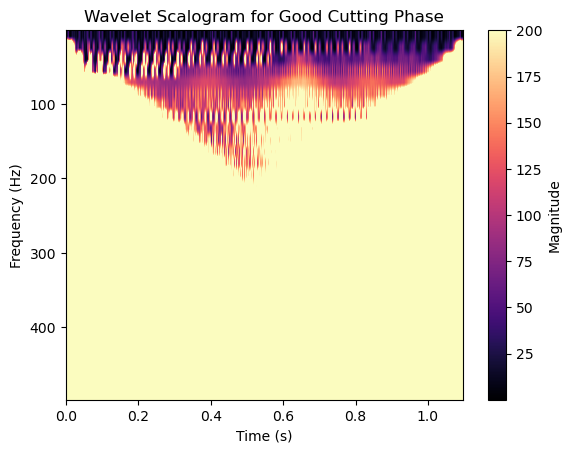

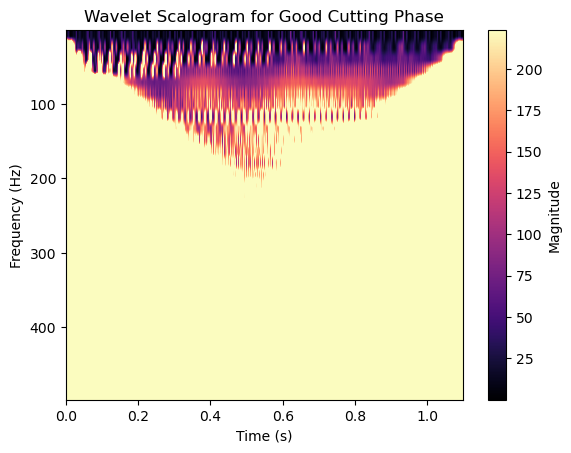

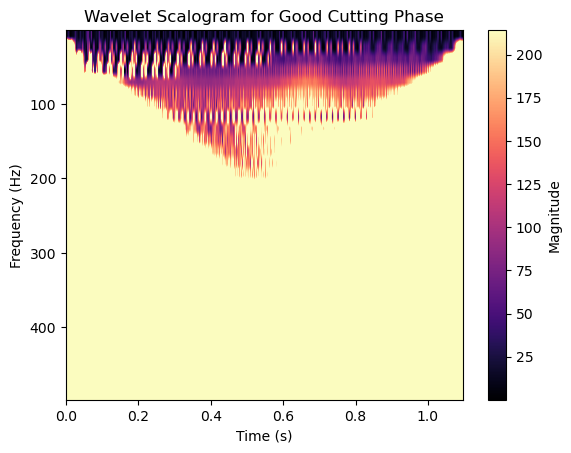

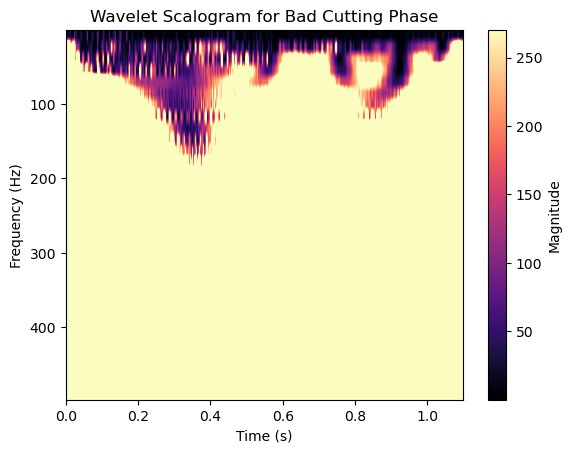

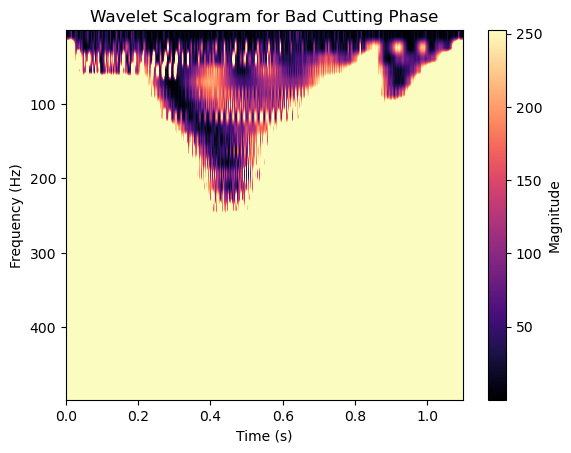

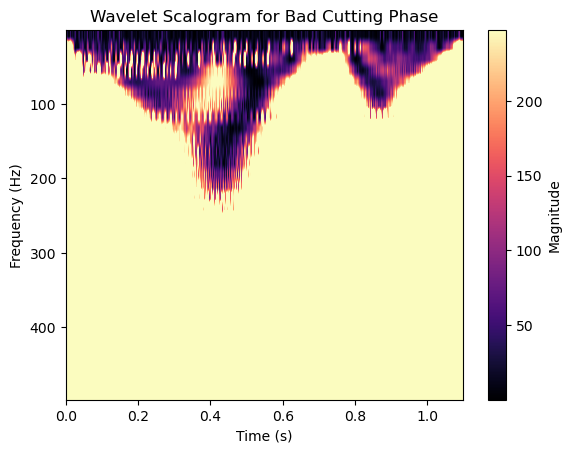

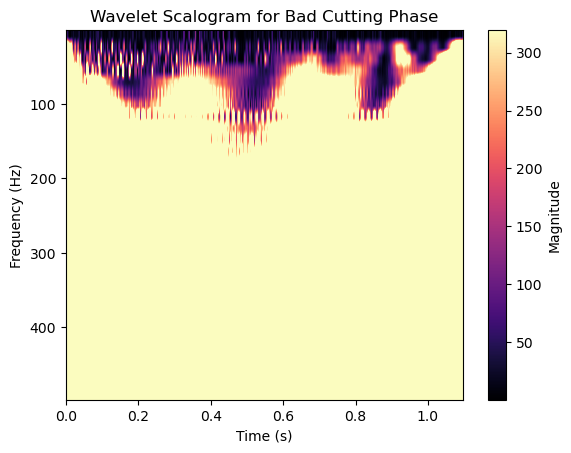

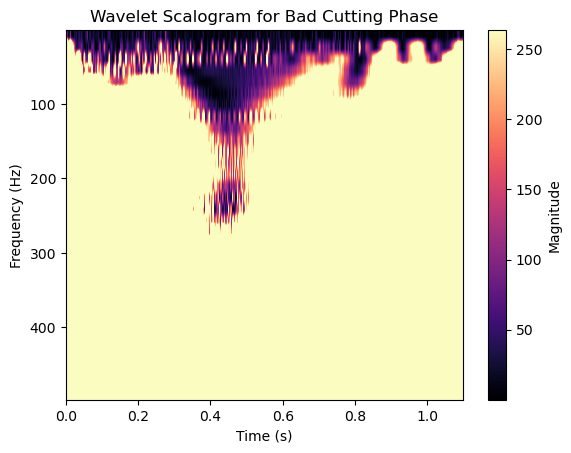

In [92]:
scale_resolution = 512

def plot_wavelet_scalogram(data, title, wavelet='cmor', cmap='magma'):
    scales = np.arange(1, scale_resolution, 16)
    coefficients, frequencies = pywt.cwt(data, scales, wavelet, sampling_period=0.002)
    power = (abs(coefficients)) ** 2

    # Create the time vector based on the length of the data and the sampling period
    time_vector = np.arange(len(data)) * 0.002


    plt.imshow(power, cmap=cmap, aspect='auto', vmax=abs(coefficients).max(), vmin=abs(coefficients).min(), extent=[time_vector[0], time_vector[-1], scales[-1], scales[0]])
    #plt.yscale('log')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')
    plt.colorbar(label='Magnitude')
    plt.title(title)
    plt.show()

for sample in good_cuttings:
    plot_wavelet_scalogram(sample['Torque'], 'Wavelet Scalogram for Good Cutting Phase')
for sample in bad_cuttings:
    plot_wavelet_scalogram(sample['Torque'], 'Wavelet Scalogram for Bad Cutting Phase')

0.0019999902898615056


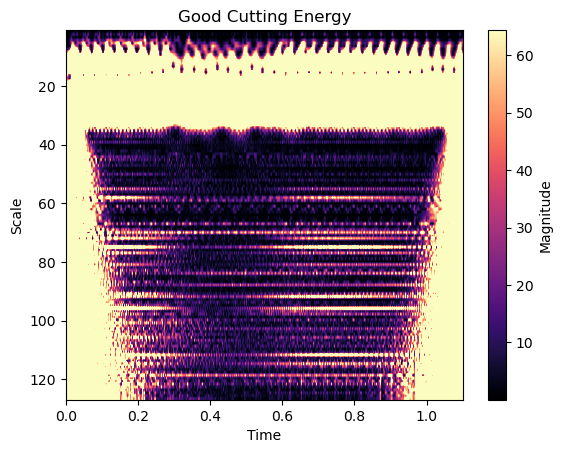

0.002000002695997339


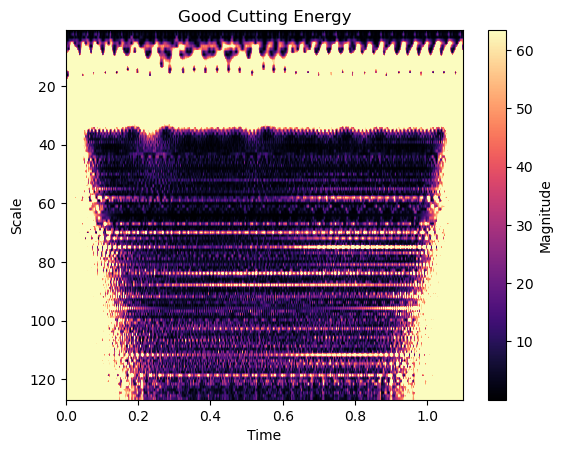

0.002000011666847842


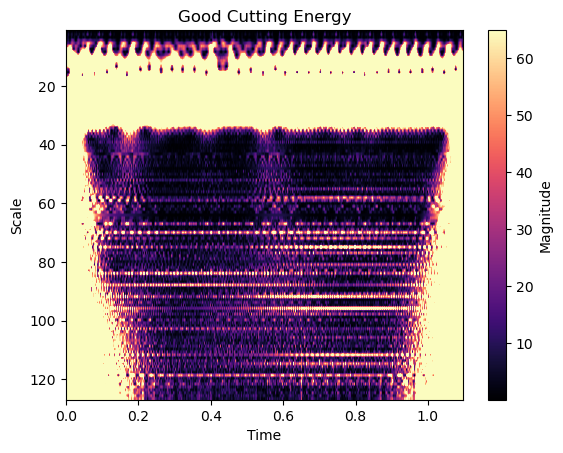

0.0019999992217739635


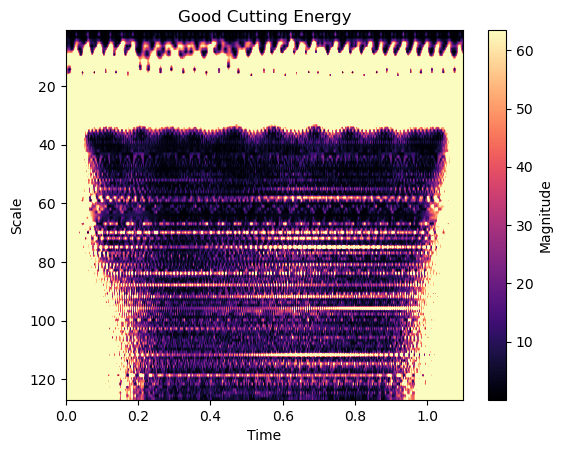

0.0019999977445950474


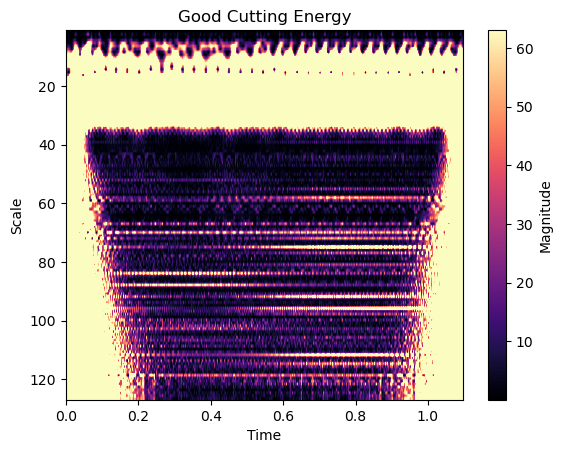

0.0020000026959973386


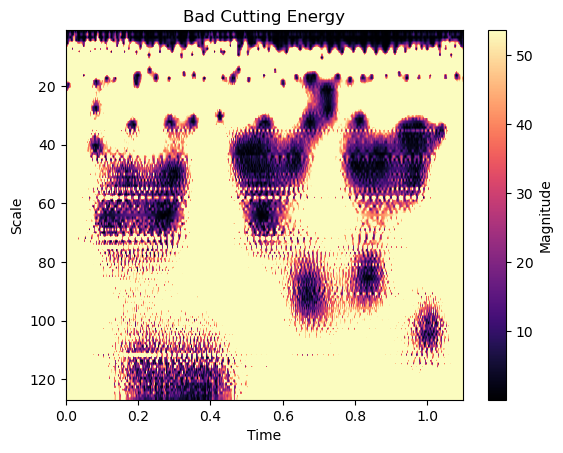

0.001999999221773964


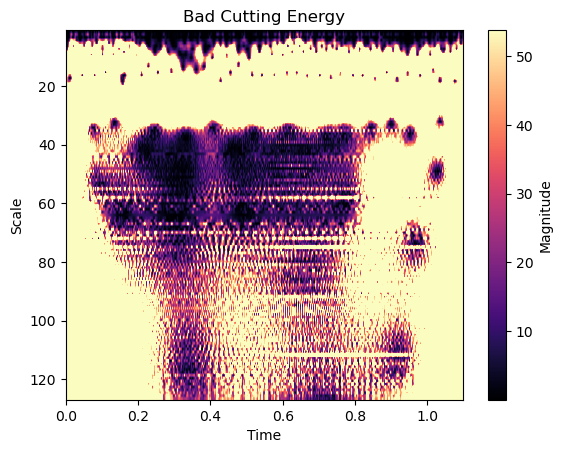

0.0019999922733272136


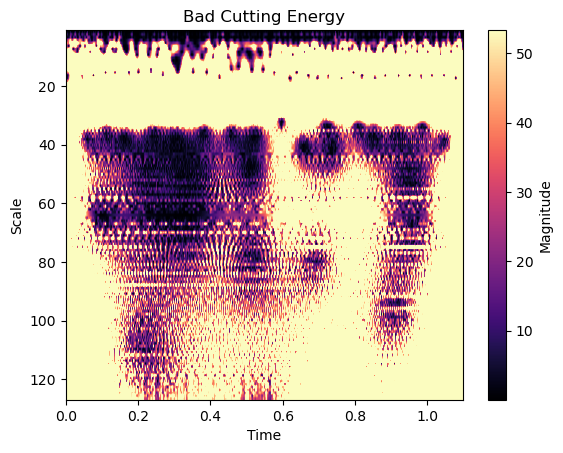

0.002000004705721445


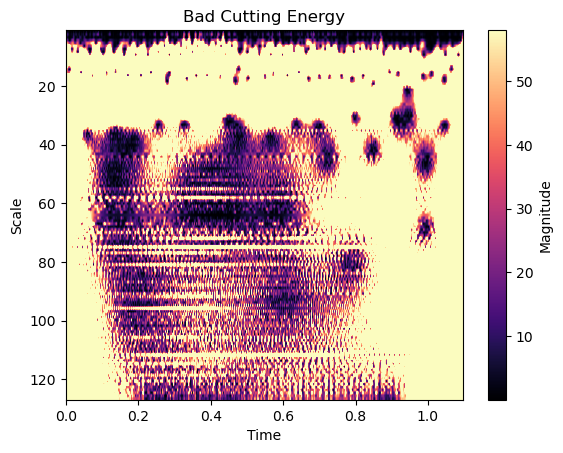

0.002000002695997339


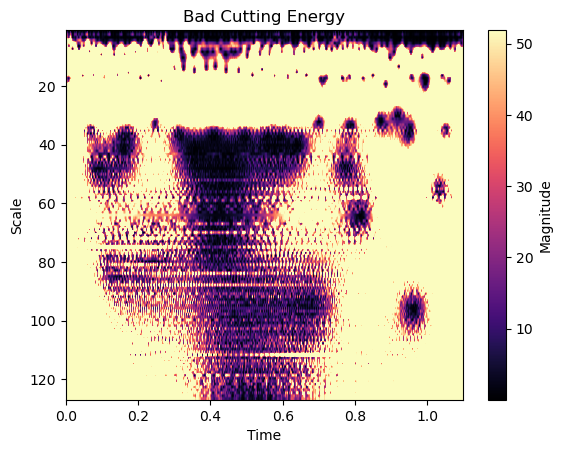

In [133]:
scale_resolution = 128

def plot_wavelet_scalogram(data, sampling_period, title, wavelet='cmor0.5-1.5', cmap='magma'):
    scales = np.arange(1, scale_resolution)
    coefficients, frequencies = pywt.cwt(data, scales, wavelet, sampling_period)
    time_vector = np.arange(len(data)) * sampling_period
    power = (abs(coefficients)) ** 2
    plt.imshow(power, cmap=cmap, aspect='auto', extent=[time_vector[0], time_vector[-1], scales[-1], scales[0]], vmax=abs(coefficients).max(), vmin=abs(coefficients).min())
    #plt.yscale('log')
    plt.ylabel('Scale')
    plt.xlabel('Time')
    plt.colorbar(label='Magnitude')
    plt.title(title)
    plt.show()



for sample in good_cuttings:
    torque = sample['Torque']
    time = sample['rel_time']
    sampling_period = np.mean(np.diff(time))

    print(sampling_period)

    plot_wavelet_scalogram(torque, sampling_period, 'Good Cutting Energy')
for sample in bad_cuttings:
    torque = sample['Torque']
    time = np.asarray(sample['rel_time'])
    sampling_period = np.mean(np.diff(time))

    print(sampling_period)

    plot_wavelet_scalogram(torque, sampling_period, 'Bad Cutting Energy')

0.0021282098232171475
Shape of Scalogram: (5, 235)


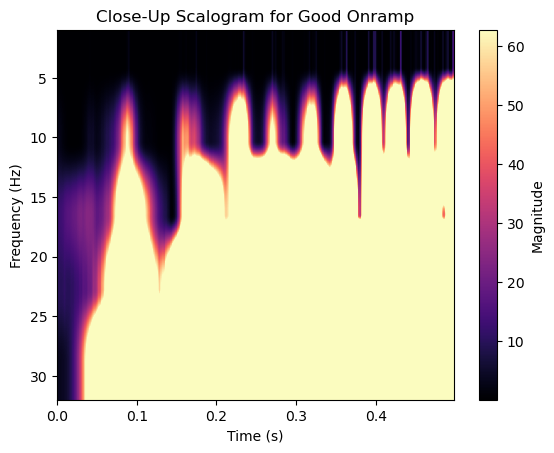

0.0021276433417137634
Shape of Scalogram: (5, 236)


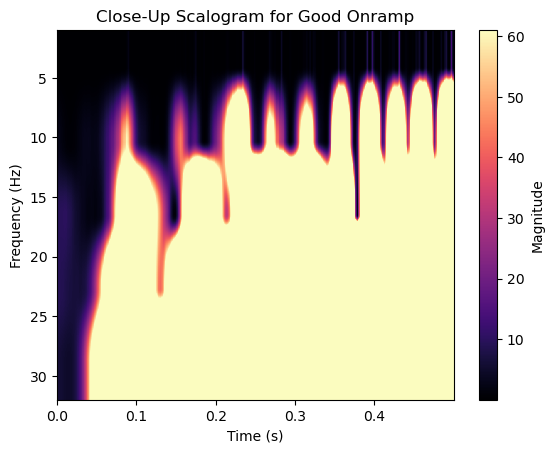

0.002127659574468085
Shape of Scalogram: (5, 236)


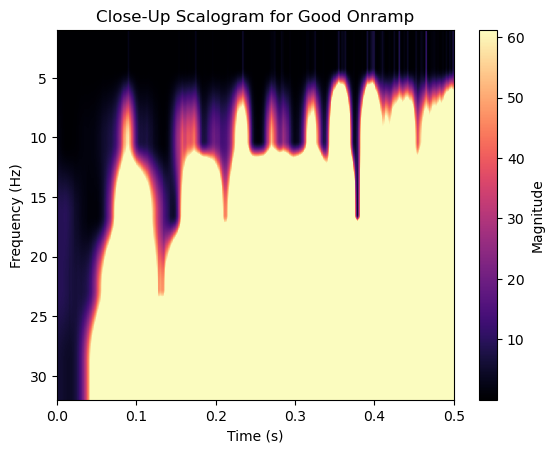

0.0021276271089594413
Shape of Scalogram: (5, 236)


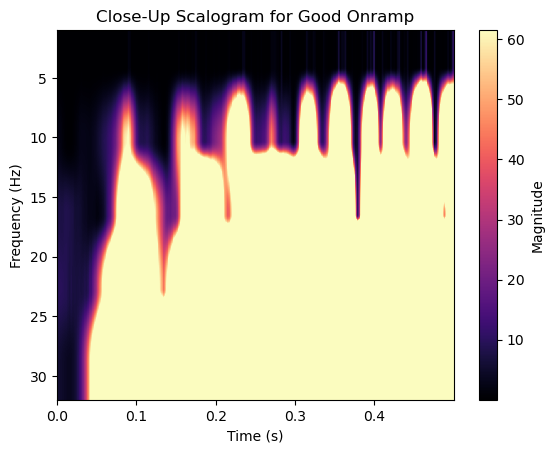

0.0021276352253366024
Shape of Scalogram: (5, 236)


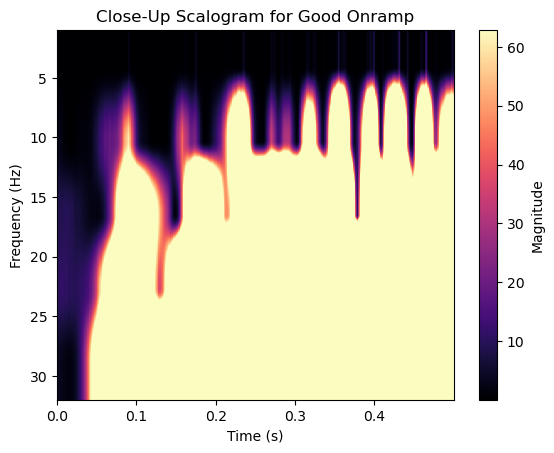

0.0021276352253366024
Shape of Scalogram: (5, 236)


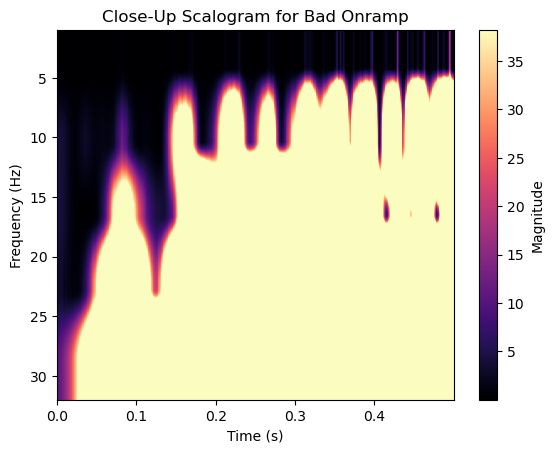

0.0021276433417137634
Shape of Scalogram: (5, 236)


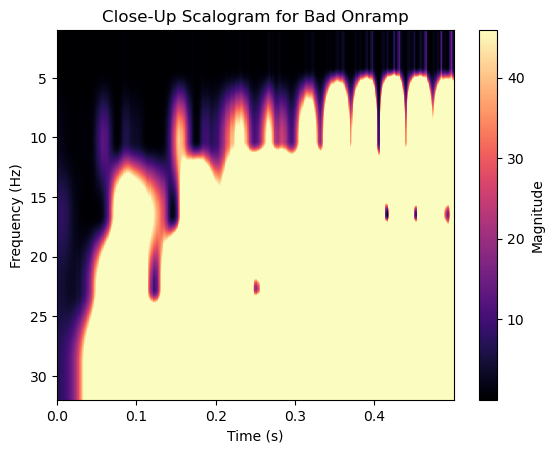

0.00212761899258228
Shape of Scalogram: (5, 236)


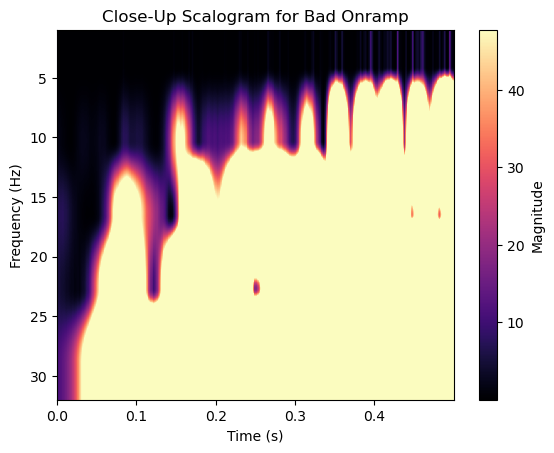

0.002127659574468085
Shape of Scalogram: (5, 236)


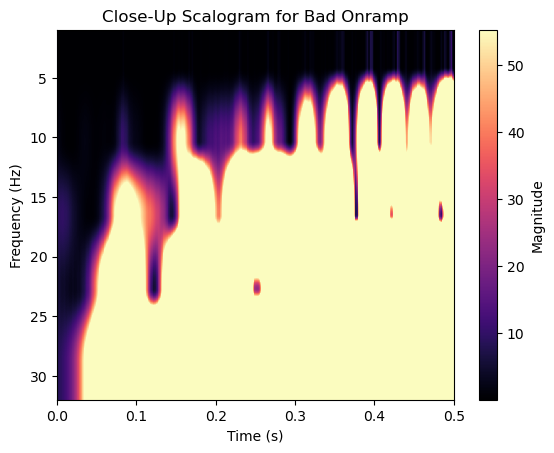

0.0021276433417137634
Shape of Scalogram: (5, 236)


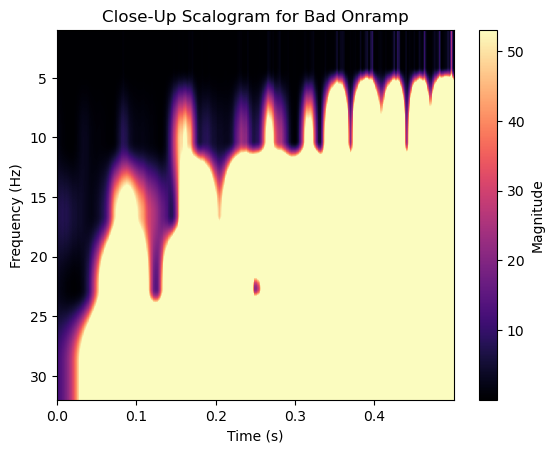

In [79]:
import numpy as np
import matplotlib.pyplot as plt
import pywt

scale_resolution = 32

def plot_wavelet_scalogram(data, sampling_period, title, wavelet='cmor0.5-1.5', cmap='magma'):
    scales = np.arange(1, scale_resolution)

    # Close up the scales to get a better resolution
    scales = np.linspace(1, scale_resolution, 5)
    
    coefficients, frequencies = pywt.cwt(data, scales, wavelet, sampling_period)
    power = (abs(coefficients)) ** 2
    
    
    # Create the time vector based on the length of the data and the sampling period
    time_vector = np.arange(len(data)) * sampling_period
    
    print("Shape of Scalogram:", power.shape)
    plt.imshow(power, cmap=cmap, aspect='auto', extent=[time_vector[0], time_vector[-1], scales[-1], scales[0]],vmax=abs(coefficients).max(), vmin=abs(coefficients).min())
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')
    plt.colorbar(label='Magnitude')
    plt.title(title)
    plt.show()


for sample in good_onramps:
    torque = sample['Torque']
    time = sample['rel_time']
    sampling_period = np.mean(np.diff(time))
    print(sampling_period)
    plot_wavelet_scalogram(torque, sampling_period, 'Close-Up Scalogram for Good Onramp')

for sample in bad_onramps:
    torque = sample['Torque']
    time = np.asarray(sample['rel_time'])
    sampling_period = np.mean(np.diff(time))
    print(sampling_period)
    plot_wavelet_scalogram(torque, sampling_period, 'Close-Up Scalogram for Bad Onramp')


## Perfect Image for classification (Cutting process at 128 scales)

0.0019999902898615056
Shape of the coefficients: (50, 551)


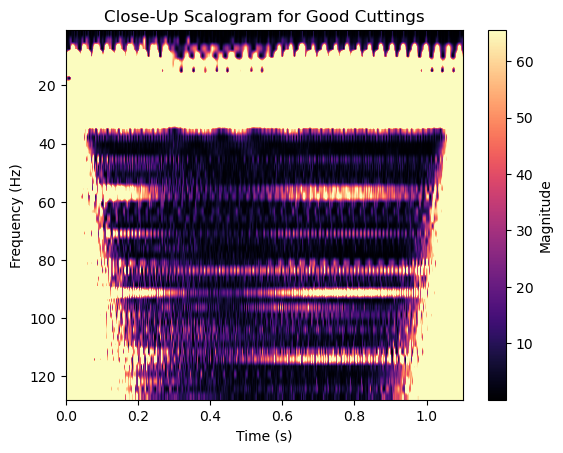

0.002000002695997339
Shape of the coefficients: (50, 550)


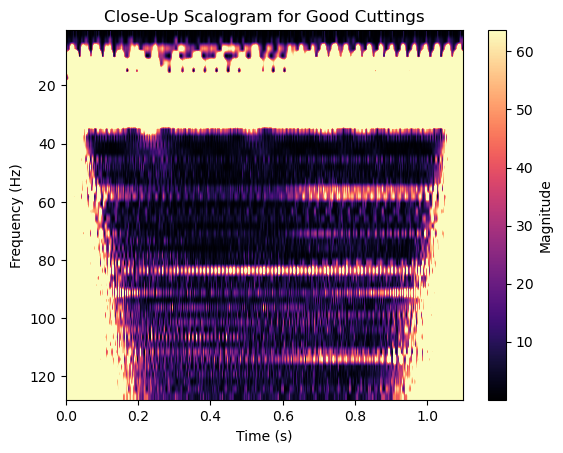

0.002000011666847842
Shape of the coefficients: (50, 549)


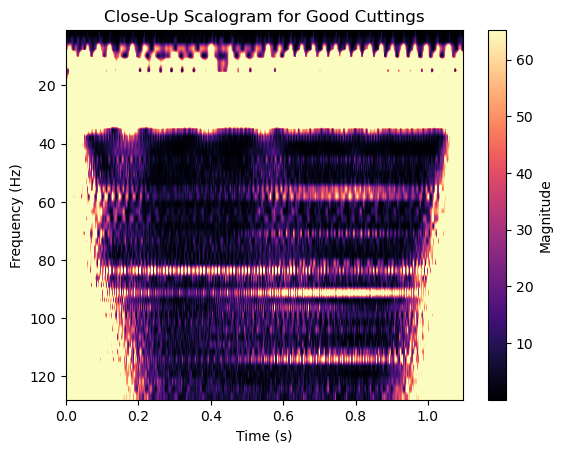

0.0019999992217739635
Shape of the coefficients: (50, 550)


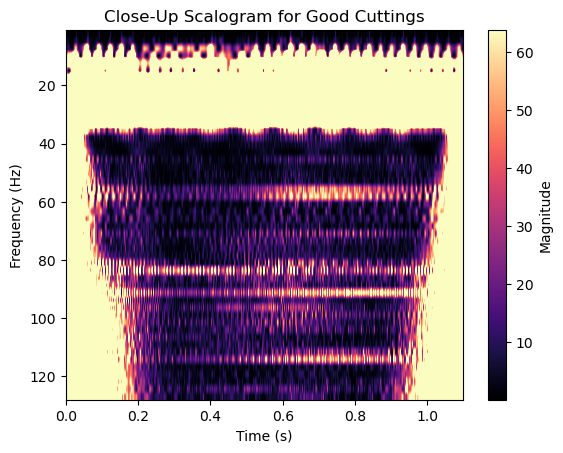

0.0019999977445950474
Shape of the coefficients: (50, 549)


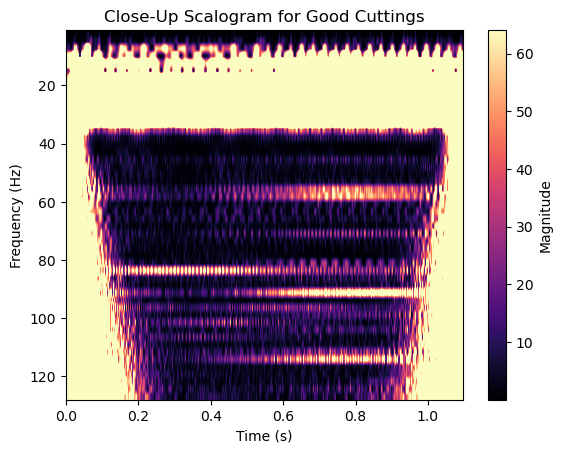

0.0020000026959973386
Shape of the coefficients: (50, 550)


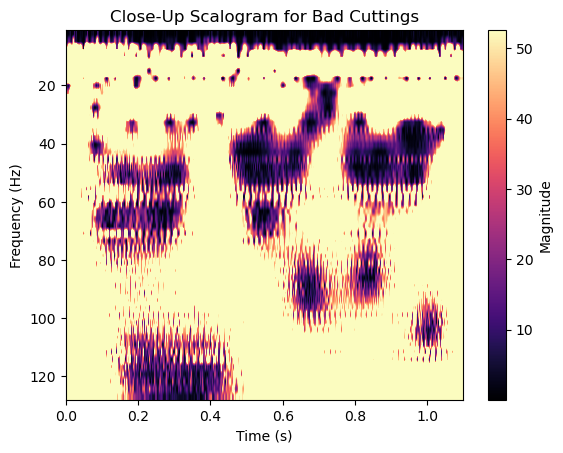

0.001999999221773964
Shape of the coefficients: (50, 550)


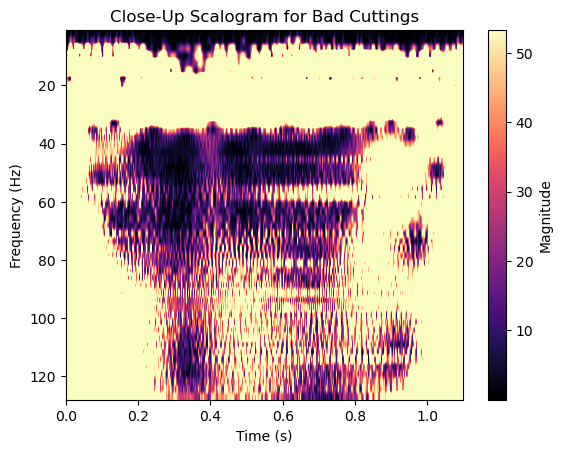

0.0019999922733272136
Shape of the coefficients: (50, 550)


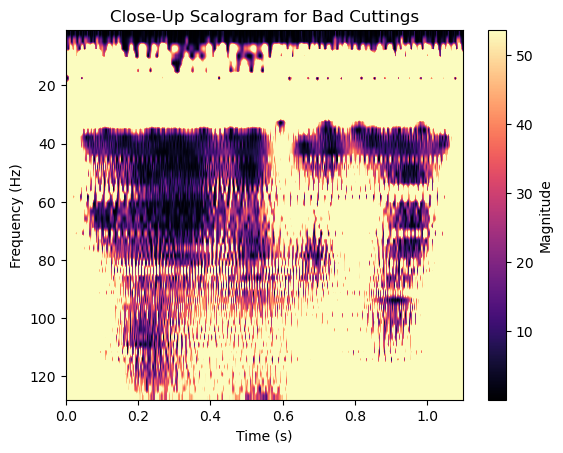

0.002000004705721445
Shape of the coefficients: (50, 549)


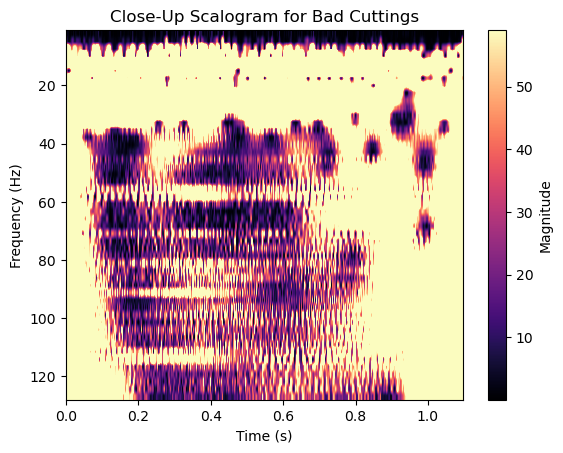

0.002000002695997339
Shape of the coefficients: (50, 550)


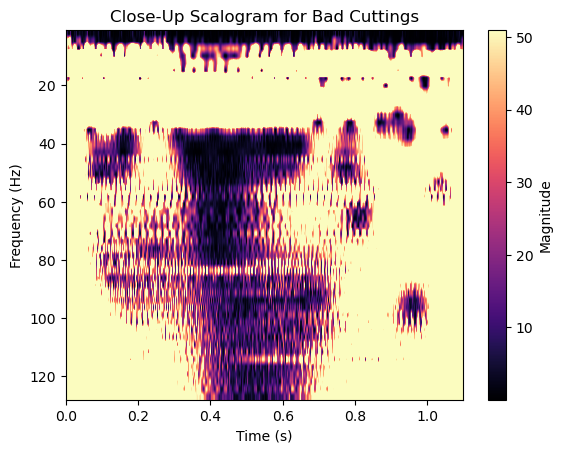

In [132]:
import numpy as np
import matplotlib.pyplot as plt
import pywt

scale_resolution = 128

def plot_wavelet_scalogram(data, sampling_period, title, wavelet='cmor0.5-1.5', cmap='magma'):
    #scales = np.arange(1, scale_resolution)

    # Close up the scales to get a better resolution
    scales = np.linspace(1, scale_resolution)
    
    coefficients, frequencies = pywt.cwt(data, scales, wavelet, sampling_period)
    power = (abs(coefficients)) ** 2
    
    print("Shape of the coefficients:", power.shape)
    # Create the time vector based on the length of the data and the sampling period
    time_vector = np.arange(len(data)) * sampling_period
    
    plt.imshow(power, cmap=cmap, aspect='auto', extent=[time_vector[0], time_vector[-1], scales[-1], scales[0]],vmax=abs(coefficients).max(), vmin=abs(coefficients).min())
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')
    plt.colorbar(label='Magnitude')
    plt.title(title)
    plt.show()


for sample in good_cuttings:
    torque = sample['Torque']
    time = sample['rel_time']
    sampling_period = np.mean(np.diff(time))
    print(sampling_period)
    plot_wavelet_scalogram(torque, sampling_period, 'Close-Up Scalogram for Good Cuttings')

for sample in bad_cuttings:
    torque = sample['Torque']
    time = np.asarray(sample['rel_time'])
    sampling_period = np.mean(np.diff(time))
    print(sampling_period)
    plot_wavelet_scalogram(torque, sampling_period, 'Close-Up Scalogram for Bad Cuttings')


## Cleaning Phase Close-Up

0.002000005334017953
Shape of the coefficients: (24, 699)


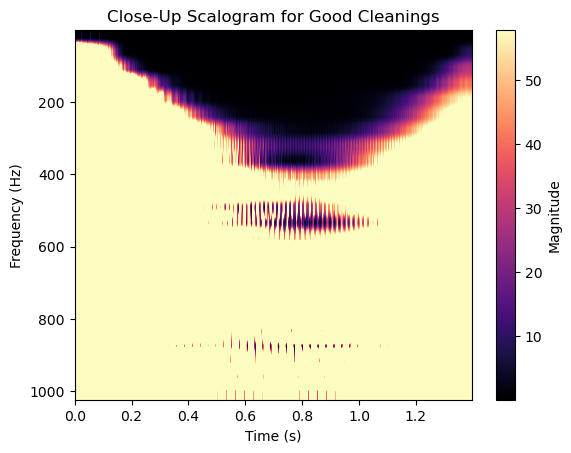

0.0020000162643826116
Shape of the coefficients: (24, 699)


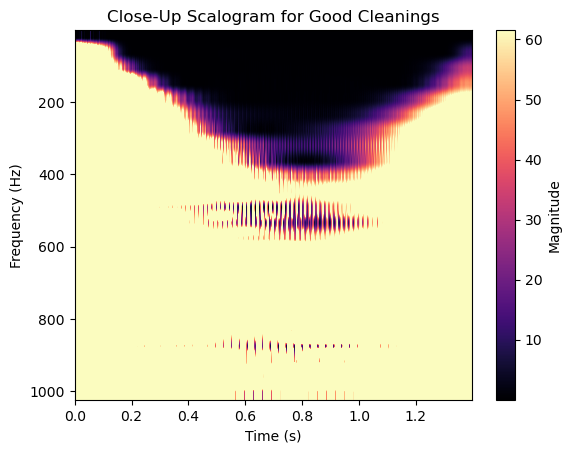

0.001999985831124442
Shape of the coefficients: (24, 701)


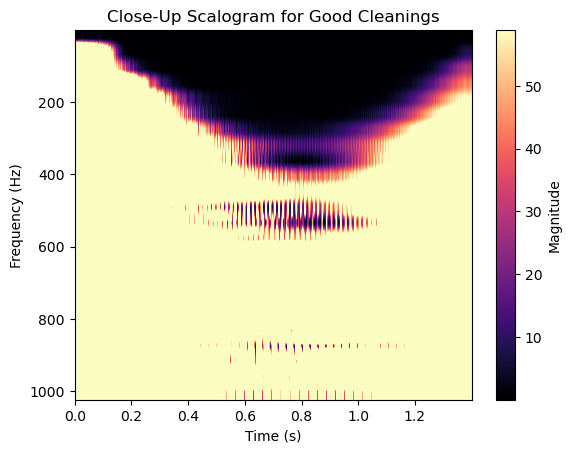

0.0020000135317914465
Shape of the coefficients: (24, 699)


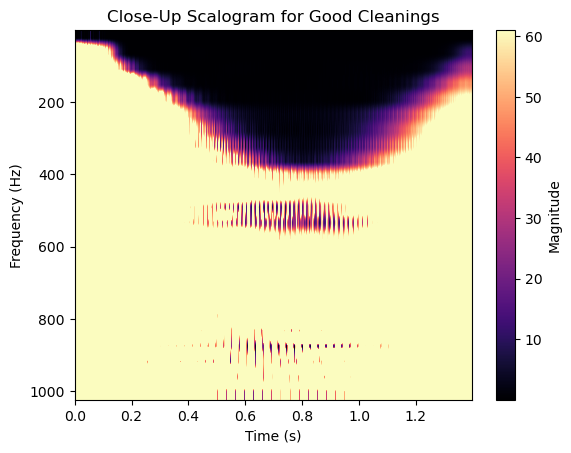

0.001999988555908203
Shape of the coefficients: (24, 701)


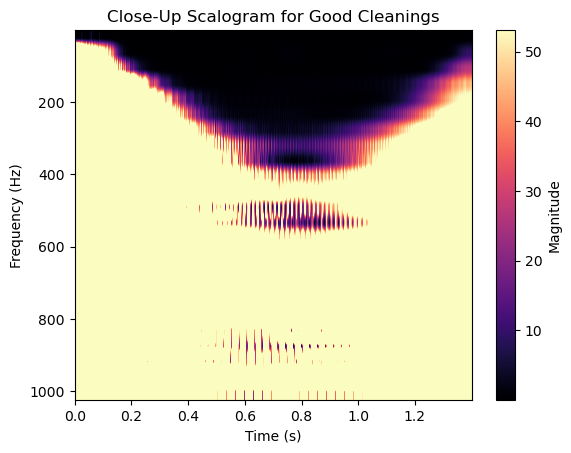

0.002000001025984386
Shape of the coefficients: (24, 700)


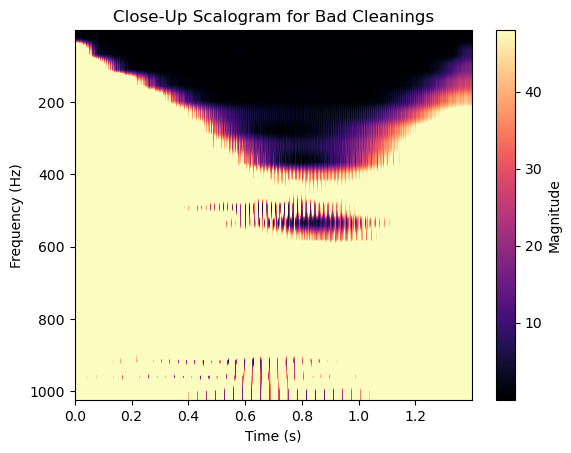

0.00199999556862063
Shape of the coefficients: (24, 700)


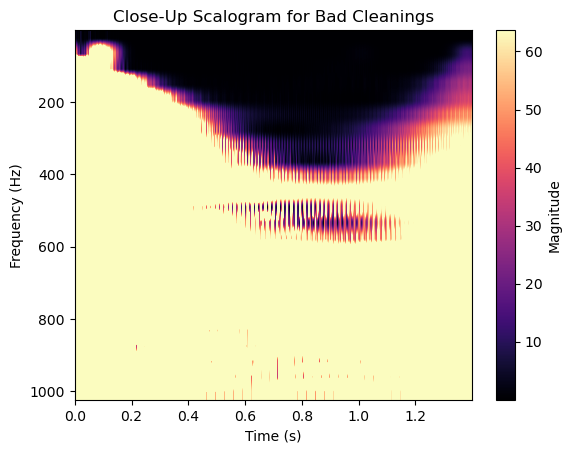

0.001999998297302508
Shape of the coefficients: (24, 700)


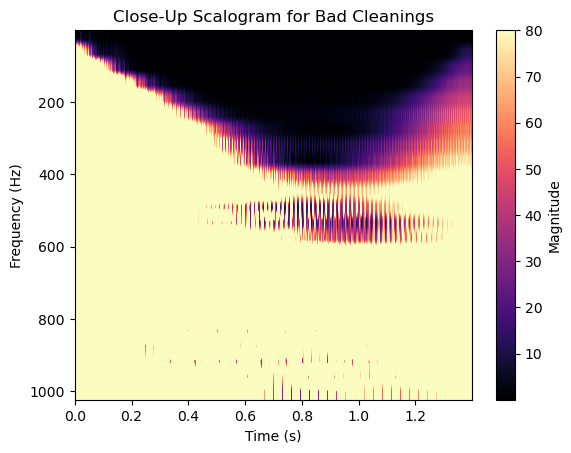

0.001999998297302508
Shape of the coefficients: (24, 700)


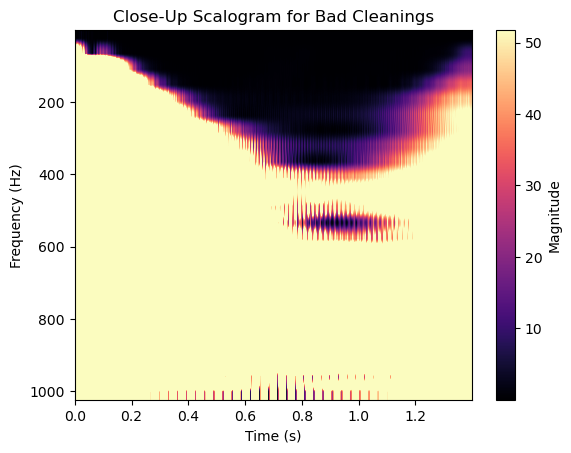

0.001999998297302508
Shape of the coefficients: (24, 700)


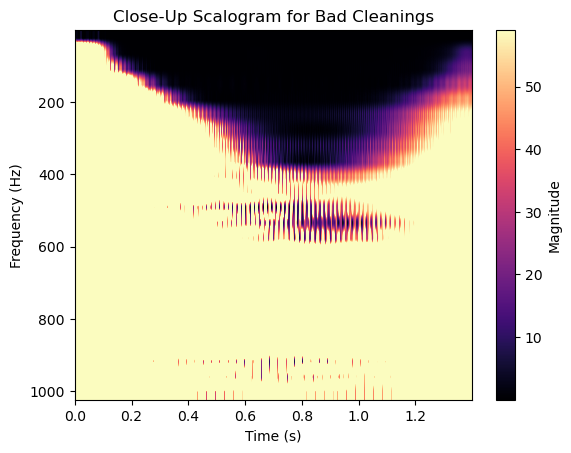

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import pywt

scale_resolution = 1024

def plot_wavelet_scalogram(data, sampling_period, title, wavelet='cmor0.5-1.5', cmap='magma'):
    #scales = np.arange(1, scale_resolution)

    # Close up the scales to get a better resolution
    scales = np.linspace(1, scale_resolution, 24)
    
    coefficients, frequencies = pywt.cwt(data, scales, wavelet, sampling_period)
    power = (abs(coefficients)) ** 2
    
    print("Shape of the coefficients:", power.shape)
    # Create the time vector based on the length of the data and the sampling period
    time_vector = np.arange(len(data)) * sampling_period
    
    plt.imshow(power, cmap=cmap, aspect='auto', extent=[time_vector[0], time_vector[-1], scales[-1], scales[0]],vmax=abs(coefficients).max(), vmin=abs(coefficients).min())
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')
    plt.colorbar(label='Magnitude')
    plt.title(title)
    plt.show()


for sample in good_cleanings:
    torque = sample['Torque']
    time = sample['rel_time']
    sampling_period = np.mean(np.diff(time))
    print(sampling_period)
    plot_wavelet_scalogram(torque, sampling_period, 'Close-Up Scalogram for Good Cleanings')

for sample in bad_cleanings:
    torque = sample['Torque']
    time = np.asarray(sample['rel_time'])
    sampling_period = np.mean(np.diff(time))
    print(sampling_period)
    plot_wavelet_scalogram(torque, sampling_period, 'Close-Up Scalogram for Bad Cleanings')


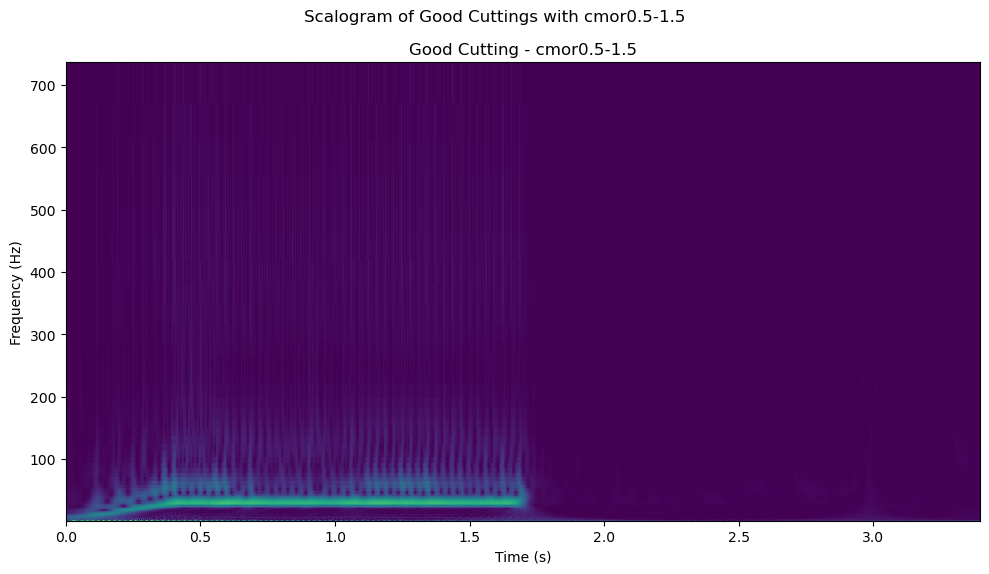

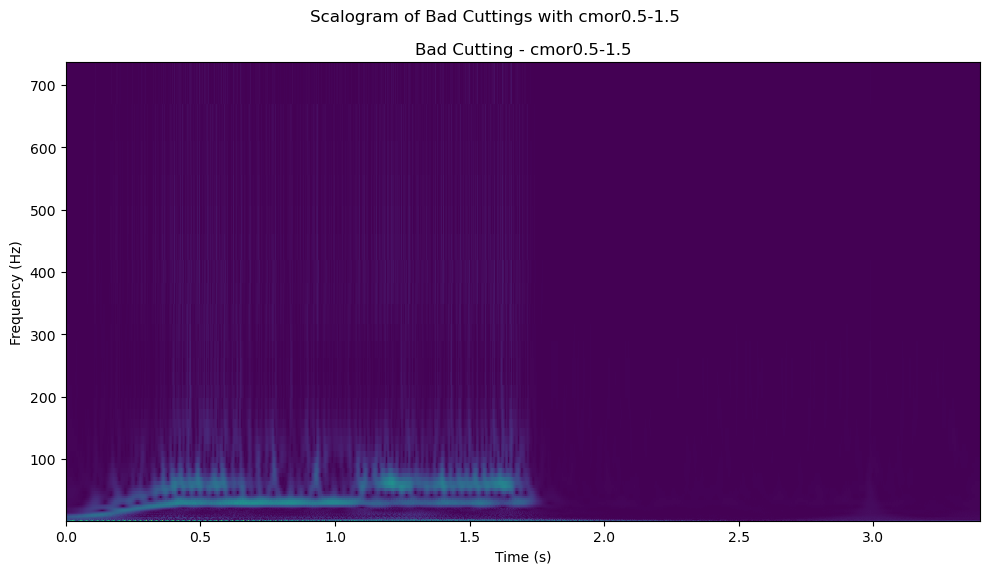

In [82]:
import numpy as np
import matplotlib.pyplot as plt
import pywt

def plot_wavelet(time, data, wavelet, title, ax):
    # Define widths using np.geomspace
    widths = np.geomspace(1, 1024, num=75)
    
    # Compute the Continuous Wavelet Transform (CWT)
    cwtmatr, freqs = pywt.cwt(data, widths, wavelet, sampling_period=np.diff(time).mean())
    
    # Calculate power and clip the last row and column
    cwtmatr = np.abs(cwtmatr[:-1, :-1])
    
    # Plot the scalogram using pcolormesh
    pcm = ax.pcolormesh(time, freqs, cwtmatr, shading='auto')
    
    # Set the y-axis to logarithmic scale
    #ax.set_yscale("log")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Frequency (Hz)")
    ax.set_title(title)
    #plt.colorbar(pcm, ax=ax)
    return ax

# Define the specific wavelet to be used
wavelet = "cmor0.5-1.5"

# Plot scalograms for good cuttings
fig, axs = plt.subplots(1, 1, figsize=(10, 6))
i = 0
for sample in all_good_segments:
    i += 1
    torque = sample['Torque']
    time = sample['rel_time']
    plot_wavelet(time, torque, wavelet, 'Good Cutting - cmor0.5-1.5', axs)
    if i == 3:
        break
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle("Scalogram of Good Cuttings with cmor0.5-1.5")
plt.show()

# Plot scalograms for bad cuttings
fig, axs = plt.subplots(1, 1, figsize=(10, 6))
i = 0
for sample in all_bad_segments:
    i += 1
    torque = sample['Torque']
    time = sample['rel_time']
    plot_wavelet(time, torque, wavelet, 'Bad Cutting - cmor0.5-1.5', axs)
    if i == 3:
        break
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle("Scalogram of Bad Cuttings with cmor0.5-1.5")
plt.show()
